## Objective

The goal of this assignment is to write custom functions to manipulate and augment images.


Artificial Intelligence models require data to learn how to solve a task. For vision related tasks, many problems don't have enough data to train a model.

If a model is not trained on sufficiently large dataset with diverse examples from varoius geographical locations, backgrounds, races, 
genders, AI will perform poorly in that task when it sees an example that was not part of its dataset.

[Here is a related article to understand how dataset size affects model performance](https://news.mit.edu/2022/machine-learning-biased-data-0221)

* **If researchers are training a model to classify cars in images, they want the model to learn what different cars look like. But if every Ford Thunderbird in the training dataset is shown from the front, when the trained model is given an image of a Ford Thunderbird shot from the side, it may misclassify it, even if it was trained on millions of car photos.**

## But what if you don't have enough images for training an algorithm?

### Data augmentation

Data Augmentation is a very powerful method to increase you dataset size. Let's say you are working on creating a software for a hospital that processes chest X-rays to understand different conditions of patient's organs. This software will do preliminary screening to help find the most relevant doctor/advanced test to perform next for helping the doctor in diagnosis.

For many medical conditions we will not have enough images available as the condition may be rare among patients.
But to create the system, we need to teach the model how to detect the conditions by giving it images with (positively diagnosed) and without (healthy) the condition and in many possible forms (angle, low lights, partial image, etc.)  so that works for many different scenarios.

**Data augmentation can achieve this.**

The augmented data will represent a more comprehensive set of possible data points, thus minimizing the distance between the data used for training the model and the data it will encounter when applied in real scenario.

Here is a paper of different augmentation techniques for images, used for satellite images studying forest health, artistic work creation, understanding the roads and oceans -- for getting a better performing AI system.

[Research Paper on augmentation](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-019-0197-0)

## Accessing a single channel of an image

When we separate the channels, they become 2D array of pixel values corresponding channels. They no longer
remain a combination of 3 separate channels (for RGB) images. And that can an easy way to augment (increase 
number of data points) your dataset with more data as you get 3 images for each image.

**Let's explore this**

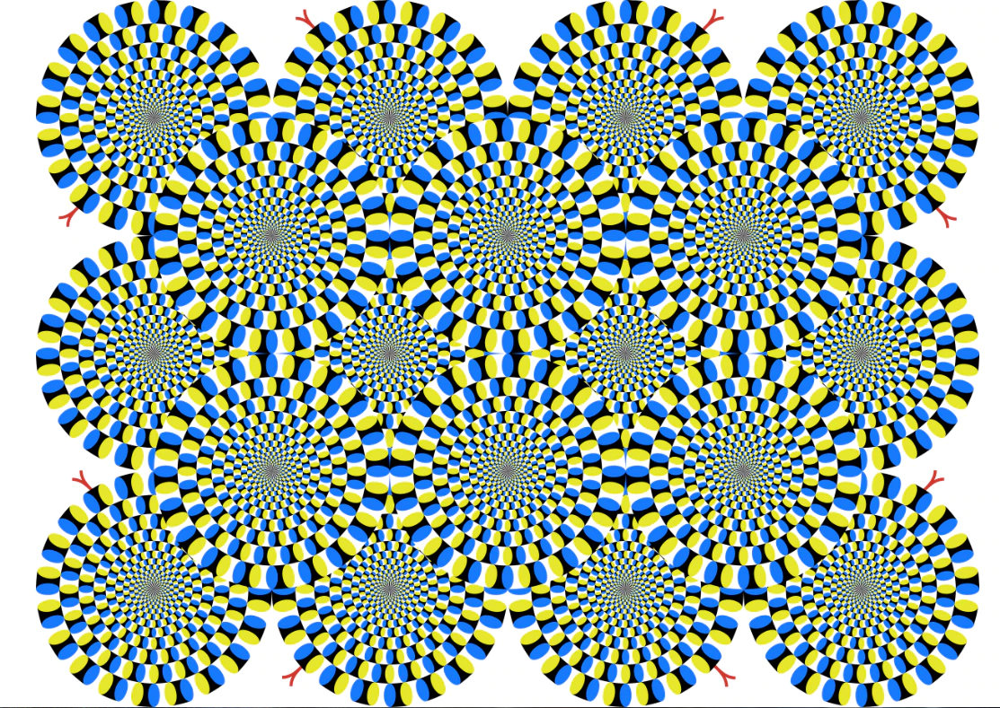

In [1]:
## import libraries
from IPython.display import display
from PIL import Image

# Open an image file
image = Image.open("illusion1.jpg")
display(image)

This is an optical illusion image where due to [Moire effect](https://www.smithsonianmag.com/science-nature/these-patterns-move-but-its-all-an-illusion-1092906/) it feels like the pinwheels are moving. 

### Let's access individual channels of the image.

In [2]:
%pip install numpy opencv-python #install openCV, only run this once at the beginning

Note: you may need to restart the kernel to use updated packages.


R channel


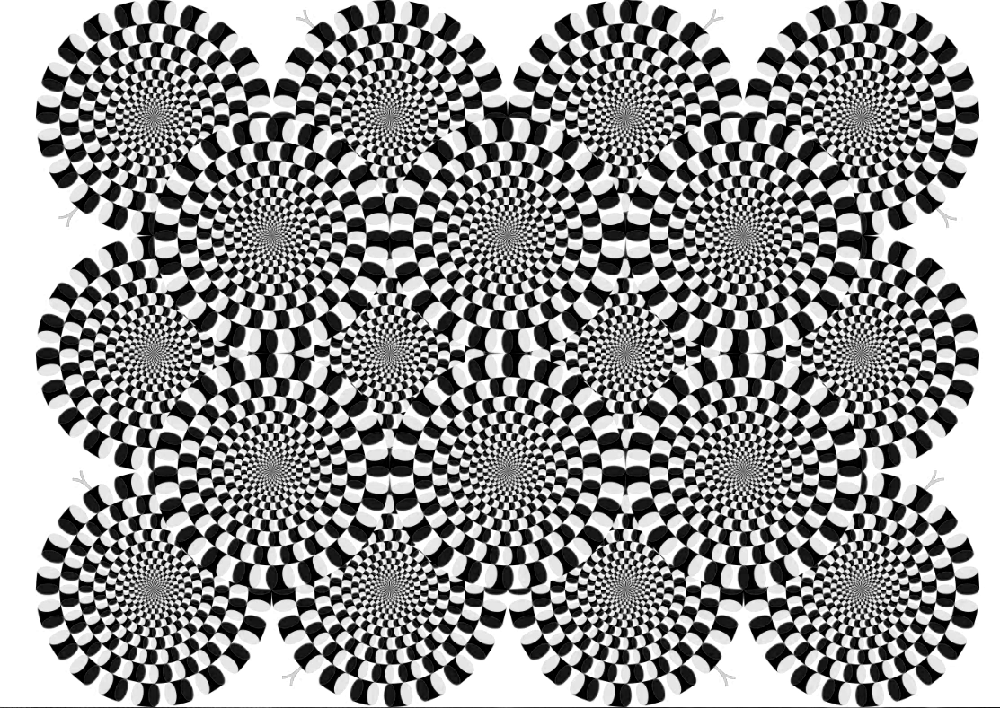

G channel


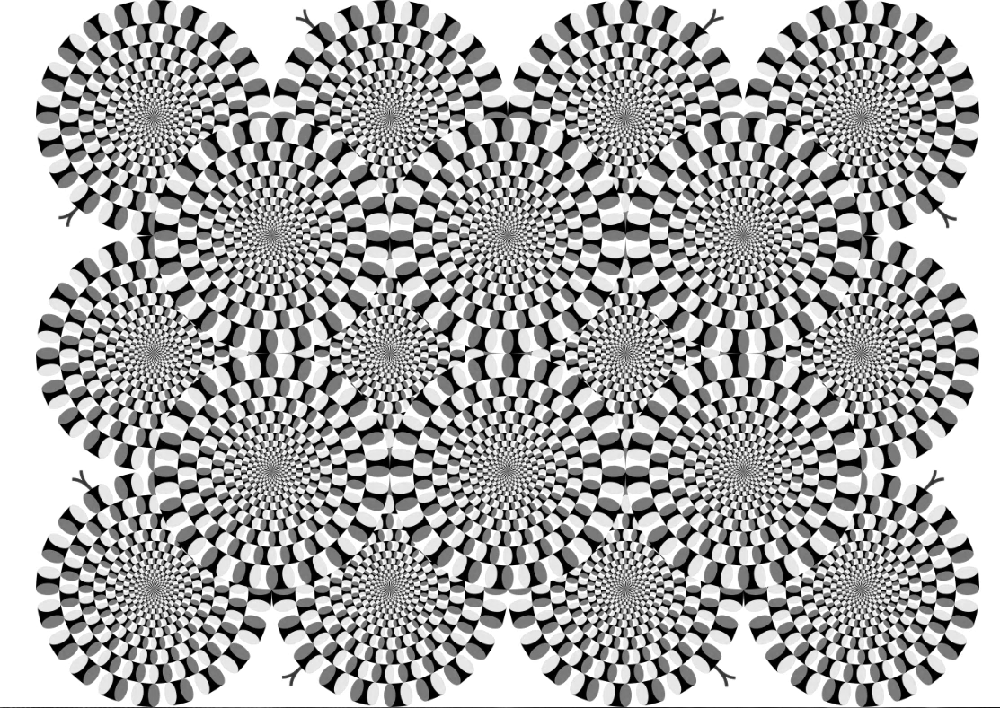

b channel


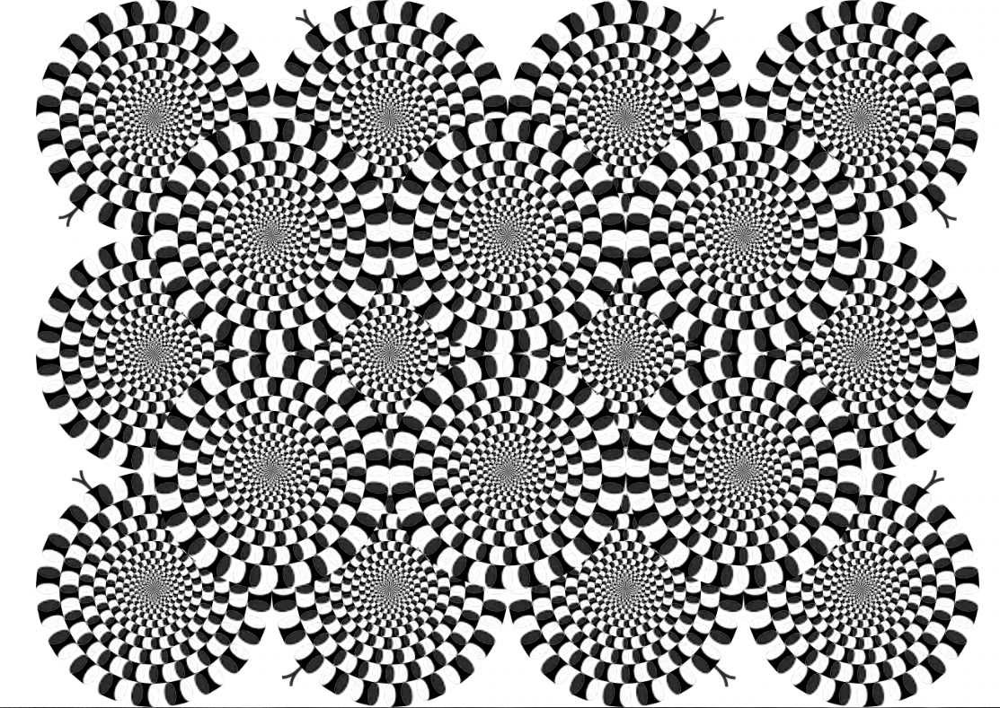

In [3]:
#using split to separate the channels
r_channel, g_channel, b_channel = image.split() 

#print and display
print('R channel')
display(r_channel)

print('G channel')
display(g_channel)

print('b channel')
display(b_channel)


## Merge the channels back again to get the original image

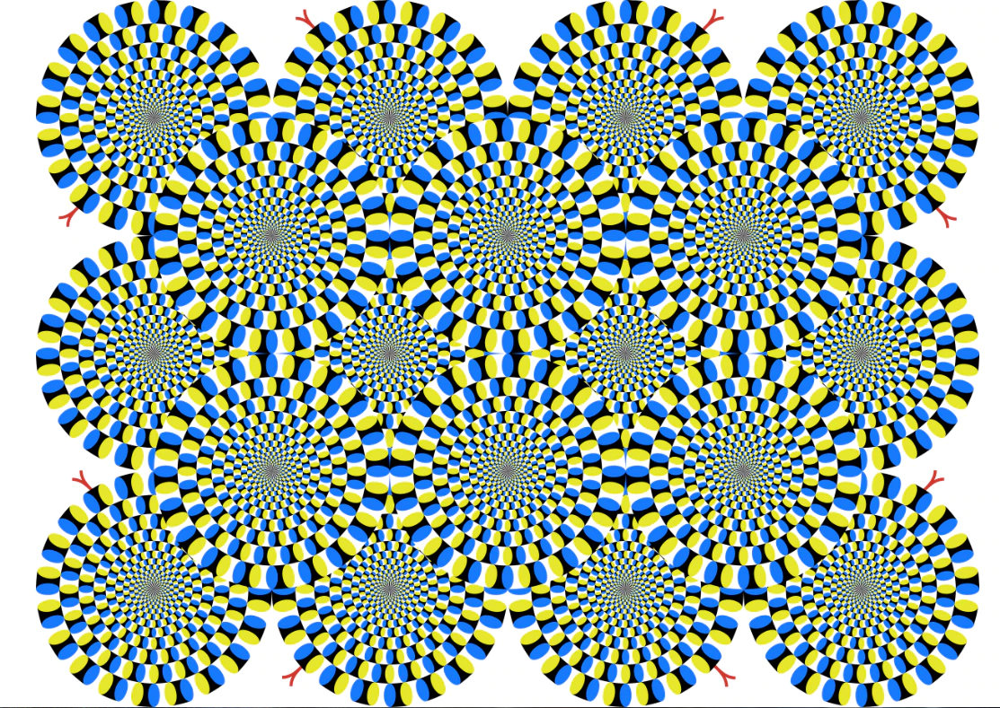

In [4]:
original_image = Image.merge("RGB", (r_channel, g_channel, b_channel))
display(original_image)

### What differences do you observe from each of these single channel image? Write in the cell below briefly. ###


# Your answer here
Each of the single channel images seems to be in black and white. They are all probably grayscale or "L" mode images.

## What happens to the image if we manipulate pixel values of a channel?

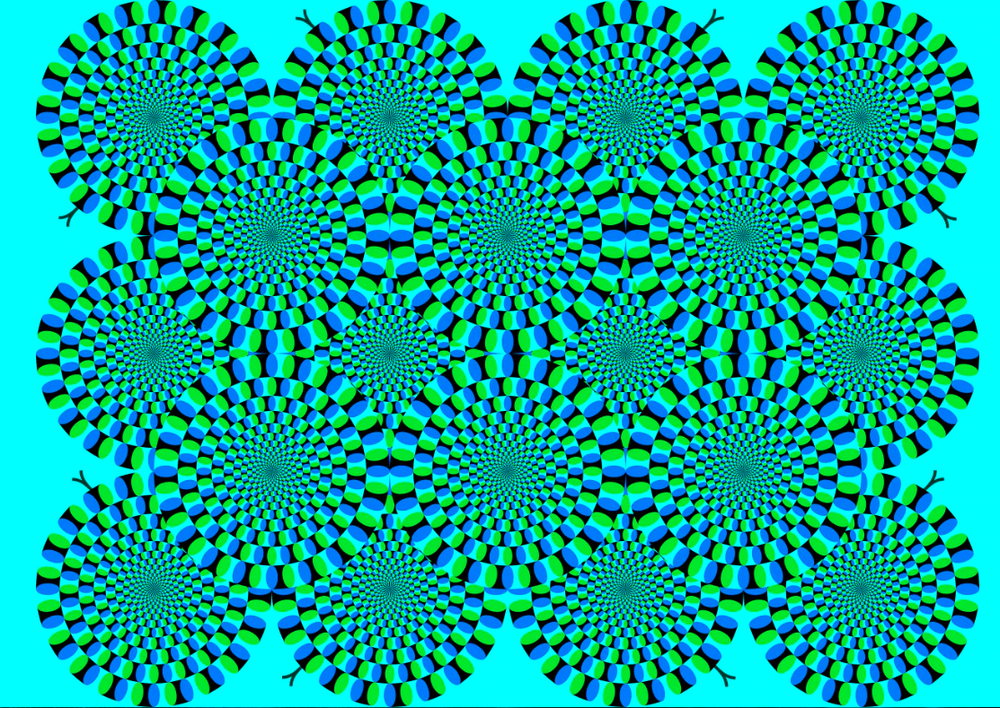

In [8]:
# accessing red channel and setting it to zero, see: https://pillow.readthedocs.io/en/stable/reference/Image.html
# using r_channel.size to get the height and width of the r_channel matrix
zero_r_channel = Image.new("L", r_channel.size, 0)

original_image = Image.merge("RGB", (zero_r_channel, g_channel, b_channel))
display(original_image)

### Perform the same operation for g and b channel and display. ###





MERGED IMAGE WITH IMPOSTER GREEN:


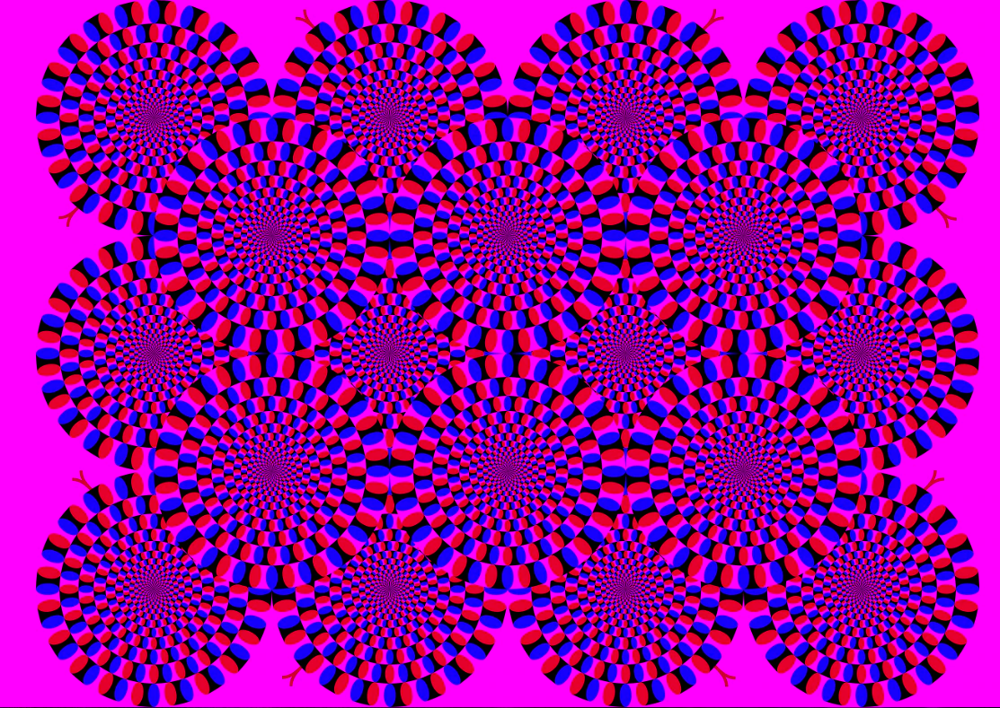

In [9]:
# augmenting the green channel
imposter_green = Image.new("L", g_channel.size, 0)

print("MERGED IMAGE WITH IMPOSTER GREEN:")
merged_image = Image.merge("RGB", (r_channel, imposter_green, b_channel))
display(merged_image)

MERGED IMAGE WITH IMPOSTER BLUE:


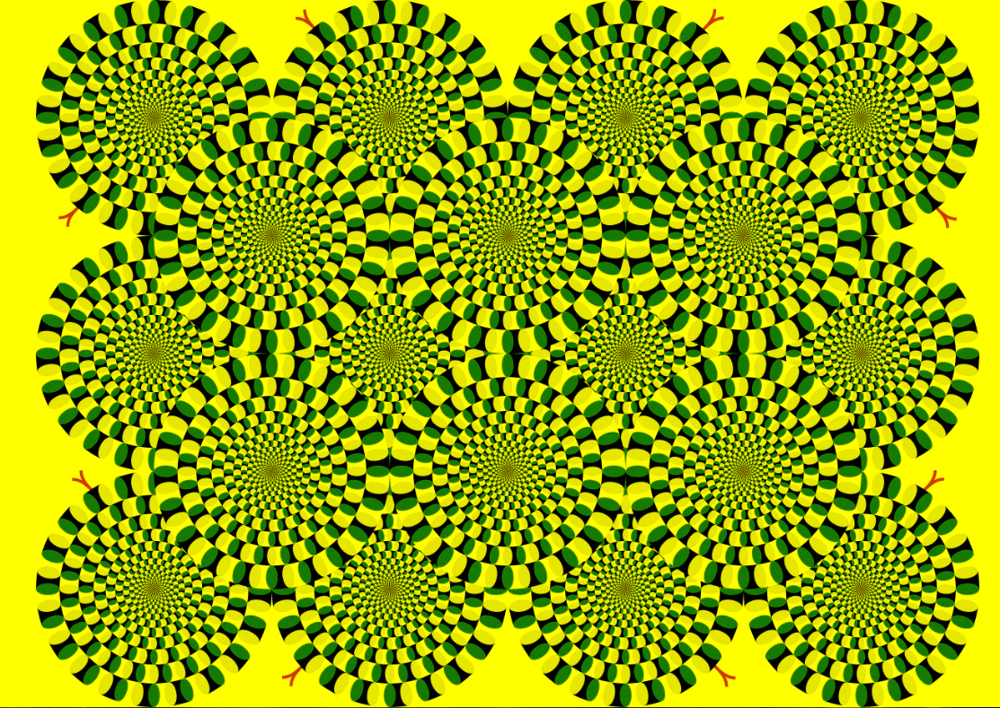

In [10]:
# augmenting the blue channel
imposter_blue = Image.new("L", b_channel.size, 0)

print("MERGED IMAGE WITH IMPOSTER BLUE:")
merged_image = Image.merge("RGB", (r_channel, g_channel, imposter_blue))
display(merged_image)

### What observations or differences you see? ###

## Your answer here
The augmented red channel image contains a lot of blue and green but no red in the coloring.
Likewise, the augmented green channel image contains a lot of red and blue but no red coloring.
The augmented blue channel image also contains a lot of red and green but no blue coloring.


**You have created three augmented version of the original image that you can use as additional data! Congratulations!**

## Task 1 (10pts)

**For the following tasks, mention which of the example images provided you used for testing your function in a comment above your code.**

**We have provided an example folder `augmented_images_examples` with sample output. Use any of the other images.**


1) Write a function `augment_image()` that will take `image_file_path` as the argument and apply different transformation methods available on pillow and will save the resulant images in a folder called `augmented_image`. (1pt)

2) When we pass a specific image file path to the function, the function will execute, apply the transformation, and save the augmented images in the folder `augmented_images`. (1pt)

You can apply the following transformation (you have seen most of them from project 1):

* rotate by 45 degrees. (1pt)
* resizing images to (200, 200) resolution (1pt)
* flip the image. (1pt)
* crop a (400, 400) patch from it (1pt)
* increase/decrese brightness by 50% (1pt)
* increase the constrast by 50% (1pt)
* blur the image using filter (1pt)
* sharpen te image by using filter (1pt)

Hint: you may use [this](https://pillow.readthedocs.io/en/stable/reference/Image.html), [this](https://pillow.readthedocs.io/en/stable/reference/ImageEnhance.html), and [this](https://pillow.readthedocs.io/en/stable/reference/ImageFilter.html) module for this.

**Apply at LEAST 8 transformations so that we have 9 images (original and 8 augmented ones).**

Grade distribution: (1 X 8 +  1 + 1) = 10pts (8 transformtaion, 1 for reading the image, 2 for saving the image).



In [ ]:
## Your code goes here

from PIL import Image, ImageEnhance, ImageFilter, ImageOps

def augment_image(image_path):
    # Open the original image
    image = Image.open(image_path)

    # Create a list to store augmented images
    augmented_images = []

    # Augmentation 1: Rotate the image by 45 degrees
    rotated_image = image.rotate(45)
    augmented_images.append(rotated_image)


    # Augmentation 2: Resize the image to 200x200 pixels
    resized_image = image.resize((200, 200))
    augmented_images.append(resized_image)

    # Augmentation 3: Crop a region defined by coordinates (left, upper, right, lower)
    cropped_image = image.crop((0, 0, 400, 400))
    augmented_images.append(cropped_image)

    # Augmentation 4: Flip the image horizontally (left to right)
    flipped_image = ImageOps.mirror(image)
    augmented_images.append(flipped_image)


    # Augmentation 5: Enhance brightness
    brightener = ImageEnhance.Brightness(image)
    brightened_image = brightener.enhance(0.5)   # decreased brightness by 50%
    augmented_images.append(brightened_image)

    # Augmentation 6: Enhance contrast
    contraster = ImageEnhance.Contrast(image)
    contrasted_image = contraster.enhance(1.5)  # increased contrast by 50 % 
    augmented_images.append(contrasted_image)

    # Augmentation 7: Apply blur
    blurred_image = image.filter(ImageFilter.BLUR)
    augmented_images.append(blurred_image)

    # Augmentation 8: Apply sharpen filter
    sharpened_image = image.filter(ImageFilter.SHARPEN)
    augmented_images.append(sharpened_image)

    return augmented_images

# Example usage:
image_path = "find_waldo.jpg"
augmented_images = augment_image(image_path)


# Save augmented images
for i, augmented_image in enumerate(augmented_images):
    augmented_image.save(f"augmented_images/augmentimage_{i}.jpg")

## Task 2 (8 pts)

Write a function `create_image_puzzle(image_path, rows, columns, output_folder)` that will take an image and covert it to a puzzle. It will tak ethe following input:

image_path: The path of the input image

rows: Number of rows

columns: Number of columns

output_folder: The folder to save the puzzle tiles of the image

**You can structure the internal body of the function in other ways too, just please make sure the function takes the same arguments we mentioned in the project description.**

In [17]:
from PIL import Image

def create_image_puzzle(input_path, rows, columns, output_path):
    image = Image.open(input_path)

    # calculate height and width per puzzle piece
    total_width, total_height = image.size
    puzzle_width = total_width // columns
    puzzle_height = total_height // rows

    # define initial left, upper, right, and lower crop box values for each puzzle piece
    left = 0
    right = puzzle_width
    upper = 0
    lower = puzzle_height

    # crop each puzzle piece and store
    for row in range(rows):
        for column in range(columns):
            piece = image.crop((left, upper, right, lower))
            piece.save(f"{output_path}/piece_{row}_{column}.jpg")
            left += puzzle_width
            right += puzzle_width

        # set new left, upper, right, and lower crop box values for next row
        upper += puzzle_height
        lower += puzzle_height
        left = 0
        right = puzzle_width

    print("Puzzles created!!")


input_image_path = "find_waldo.jpg"      #change this to image nam eof your preference
rows = 3
columns = 3
output_folder = "puzzle_pieces"

create_image_puzzle(input_image_path, rows, columns, output_folder)

Puzzles created!!


## Task 3 (8 pts)

Write a function `put_image_puzzle_back_together(input_folder, output_path, rows, columns)` that will put the tiles back togetehr to construct the original image.

The function will take following input:

input_folder: Folder location where puzzle tiles form the image are saved

output_path: The path of the output image (if you select `CS166_Project2`, it should be saved in the main directory where your notebook is)


**We have provided some instructions in the function body, but following them is optional. The key rule is your function should take the same set of arguments as we mentioned, and provide the desired output.**

In [21]:
import os

def put_image_puzzle_back_together(input_folder, output_path, rows, columns):
    # get dimensions of individual puzzle pieces from first piece
    piece_width, piece_height = Image.open(f"{input_folder}/piece_0_0.jpg").size

    # calculate canvas size from piece size
    canvas_width = piece_width * columns
    canvas_height = piece_height * rows

    # create the canvas
    canvas = Image.new("RGB", (canvas_width, canvas_height))

    # define initial x and y coordinates for pasting the first image
    paste_x = 0
    paste_y = 0

    # paste each piece unto canvas
    for row in range(rows):
        for column in range(columns):
            piece = Image.open(f"{input_folder}/piece_{row}_{column}.jpg")
            canvas.paste(piece, (paste_x, paste_y))
            paste_x += piece_width

        # update x and y coordinates for next row
        paste_y += piece_height
        paste_x = 0
    
    # save the assembled image
    canvas.save(f"{output_path}/assembled_image.jpg")
    print("Assembled image created!")

# Example usage:
input_folder = "puzzle_pieces"
output_path = "CS166_Project2"


put_image_puzzle_back_together(input_folder, output_path, rows, columns)

Assembled image created!


## Extensions

Congratulations on completing the core tasks! If you have generated the augmented, tiled images and put them back together, and  saved/displayed them as expected, you've earned 26/30 points.

The remaining 4/30 are a chance for you to earn credit for exploring parts of resources mentioned in this project and digging deeper to express your creativity! This is entirely optional; 26/30 is a B and is a perfectly respectable place to stop. Extensions are open-ended and exist to compliment the structured core project. Explore and learn something new that interests you! Concentrating your energy on 1-2 "deep" extensions that challenge you will earn you more points than many small, "shallow" extensions.

You can pick you own topics that interest you. Here are a few examples:

* Try showing the image tiles as a single image side by side like an actual [puzzle](https://www.pinterest.com/pin/432908582905013211/). You can save the image following the code examples above. Name the result image (`Extension1.jpg`).

* Randomize the tiles so that it looks like a real puzzle, and then present it. 

* Can you make a puzzle from an image and put it back together if it is not a square matrix? (e.g. rows = 4, columns = 3, number of tiles = 12).

* Any other method you can add to make to make the puzzle creation and puzzle solving interesting for people to try. Have fun!


## Checklist

Before you submit:

* Make sure to edit the readme file to add your name.

* Make sure you have answered each questions. You can find sample inputs and output image folders in the project directory.

* You have added your code and the output image is displayed in the notebook. (you can also save each of them, make sure to name them using the task/extension number).
    Submit your code to Github Classroom assignment link.

* You are welcome to use other images from your collection. Have fun!

## My Extension
A semi-interactive 3 x 3 puzzle piece game implemented using the Pillow library alone.
The game is best played in a Google Colab notebook environment.

Features:
1. The game downloads an arbitrary image and constructs puzzle tiles from it.
2. The tiles are arranged on a 3 x 3 grid with one tile missing which will create an empty slot.
3. Each tile can only be moved to an adjacent empty slot.
4. The game detects when the puzzle tiles have been aligned correctly and congratulates the player.

How to Play:
1. Observe the initial arrangement of the puzzle to get a sense of what the original image looked like.
2. Enter any tile number (the numbers on the tile images) when the game prompts you for which tile you would like to move.
3. Enter the position of the empty slot when the game prompts you for which position you would like to move it to.
 **NB:** The slots are numbered from 1 through to 9 starting from the tile in the upper left of the puzzle and counting horizontally.
     The initial empty slot will always be position 9.
4. Repeat steps 2 and 3 until the tiles have been aligned correctly to form the original image.

 - I also deployed the logic for the game as a Python package to make it easy for anyone to pip install and run the game in a Google Colab notebook, and the official repository for it is available [here](https://github.com/francisohara24/image-puzzle-game).

In [6]:
"""Helper functions and classes for the puzzle game."""
# =======================================FUNCTIONS---------------------------------------------------
from PIL import Image
from PIL.ImageDraw import ImageDraw
from random import randint
from time import sleep

def divide_image( input_image: Image, rows: int, columns: int) -> list[Image]:
    """Divide `input_image` into `rows` x `columns` pieces and return a list of the pieces."""
    pieces = []  # list of resulting image pieces
    total_width, total_height = input_image.size # input image dimensions
    piece_width = total_width // columns  # width of each piece
    piece_height = total_height // rows  # height of each piece

    # define initial cropping coordinates
    left = 0
    upper = 0
    right = piece_width
    lower = piece_height

    # crop image into pieces
    for row in range(rows):
        for column in range(columns):
            # crop image piece and append to list of pieces
            piece = input_image.crop((left, upper, right, lower))
            pieces.append(piece)

            # update cropping coordinates for next column
            left += piece_width
            right += piece_width

        # update cropping coordinates for next row
        left = 0
        right = piece_width
        upper += piece_height
        lower += piece_height

    return pieces


def random_list_generator(b: int) -> list[int]:
    """Return a list of `b` random integers within the range of 1 to `b` inclusive.
    The randomness is in the position of each number in the list."""
    numbers = []
    while len(numbers) < b:
        number = randint(1, b)
        if number not in numbers:
            numbers.append(number)

    return numbers

def game_print(string: str, delay_s: float = 0.1) -> None:
    """Print a given text string in a game-like manner by delaying the printing of each character by 0.1 seconds."""
    for char in string:
        print(char, end="")
        sleep(delay_s) # delay the printing of each character by 0.1s


# ================================================CLASSES=================================================================
from PIL import Image
from IPython.display import display
import requests


class Tile:
    """Class for representing each tile in the puzzle."""
    tile_id = None
    position = None
    right_position = None
    image = None

    def __init__(self, tile_id: int, position: int, right_position: int, image: Image):
        self.tile_id = tile_id
        self.position = position
        self.right_position = right_position # the correct position of the tile in the puzzle
        self.image = image


    def render(self):
        drawer = ImageDraw(self.image)
        drawer.text((0,0), str(self.tile_id), fill=(255, 255, 255))
        return self.image

class Puzzle:
    """Class for representing the puzzle in the game."""
    image = None
    tiles  = {}
    empty_position = None
    movable_positions = []

    def __init__(self, puzzle_image_url: str):
        # Read puzzle image
        puzzle_image = requests.get(puzzle_image_url, stream=True).raw
        self.image = Image.open(puzzle_image)
        
        # Divide image into list of 9 images
        tile_images = divide_image(self.image, 3,3)

        
    # construct 8 tiles from images
        random_positions = random_list_generator(8)
        for i in range(len(tile_images) - 1):
            right_position = i + 1
            random_position = random_positions[i]
            tile_id = random_position
            tile_image = tile_images[i]

            tile = Tile(tile_id, random_position, right_position, tile_image)
            self.tiles[tile.tile_id] = tile

        # set initial empty position
        self.empty_position = 9

        # set which tiles are movable based on initial empty position
        self.update_movable_tiles()


    def update_movable_tiles(self):
        """update which tiles are movable and which are not based on the current empty slot."""

        # make all tiles immovable
        self.movable_positions = []

        # update movable tiles based on empty position
        match self.empty_position:
            case 1:
                self.movable_positions.extend([2, 4])
            case 2:
                self.movable_positions.extend([1, 3, 5])
            case 3:
                self.movable_positions.extend([2, 6])
            case 4:
                self.movable_positions.extend([1, 5, 7])
            case 5:
                self.movable_positions.extend([2, 4, 6, 8])
            case 6:
                self.movable_positions.extend([3, 5, 9])
            case 7:
                self.movable_positions.extend([4, 8])
            case 8:
                self.movable_positions.extend([7, 5, 9])
            case 9:
                self.movable_positions.extend([8, 6])

    def move(self, tile_id: int, new_position: int) -> bool:
        """Move specified tile to specified position and update the current empty slot."""
        tile_position = self.tiles[tile_id].position # position of tile to be moved

        # check if new position is empty and tile is movable
        if new_position == self.empty_position and tile_position in self.movable_positions:
            self.tiles[tile_id].position = new_position   # set tile position to new_position
            self.empty_position = tile_position   # set new empty position for the puzzle

        else:
            return False

        # update list of movable tiles
        self.update_movable_tiles()

        return True

    def check_if_player_won(self):
        """Check if player won (i.e. if all tiles are in the right position)"""
        player_won = True
        for tile in self.tiles.values():
            if tile.position != tile.right_position:
                player_won = False
                break
        return player_won


    def render_puzzle(self):
        total_width, total_height = self.image.size
        tile_width = total_width // 3
        tile_height = total_height // 3
        rendered_puzzle = Image.new("RGB", (total_width, total_height), (255, 255, 255))

        for tile in self.tiles.values():
            tile_coordinate_x = tile_width * divmod(tile.position - 1, 3)[1]
            tile_coordinate_y = tile_height * divmod(tile.position - 1, 3)[0]
            rendered_puzzle.paste(tile.render(), (tile_coordinate_x, tile_coordinate_y))

        display(rendered_puzzle)

    def start_win_sequence(self):
        """Write images and text to congratulate the player"""
        win_message = """
 ██████╗ ██████╗ ███╗   ██╗ ██████╗ ██████╗  █████╗ ████████╗██╗   ██╗██╗      █████╗ ████████╗██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██╔═══██╗████╗  ██║██╔════╝ ██╔══██╗██╔══██╗╚══██╔══╝██║   ██║██║     ██╔══██╗╚══██╔══╝██║██╔═══██╗████╗  ██║██╔════╝
██║     ██║   ██║██╔██╗ ██║██║  ███╗██████╔╝███████║   ██║   ██║   ██║██║     ███████║   ██║   ██║██║   ██║██╔██╗ ██║███████╗
██║     ██║   ██║██║╚██╗██║██║   ██║██╔══██╗██╔══██║   ██║   ██║   ██║██║     ██╔══██║   ██║   ██║██║   ██║██║╚██╗██║╚════██║
╚██████╗╚██████╔╝██║ ╚████║╚██████╔╝██║  ██║██║  ██║   ██║   ╚██████╔╝███████╗██║  ██║   ██║   ██║╚██████╔╝██║ ╚████║███████║
 ╚═════╝ ╚═════╝ ╚═╝  ╚═══╝ ╚═════╝ ╚═╝  ╚═╝╚═╝  ╚═╝   ╚═╝    ╚═════╝ ╚══════╝╚═╝  ╚═╝   ╚═╝   ╚═╝ ╚═════╝ ╚═╝  ╚═══╝╚══════╝                                                                                                                             
"""
        print(win_message)
        # TODO: render winning image
        # TODO: display time taken to solve puzzle in winning image


# ================================================THE=MAIN=GAME=SEQUENCE=================================================================

"""The main game sequence"""
def play():
    """Start the main game sequence"""

    # Welcome the user to the game
    # create animated text effect using time.sleep() define as helper function
    game_print("WELCOME TO THE IMAGE PUZZLE GAME!")

    # Instantiate puzzle and display to user
    game = Puzzle("https://imageupload.io/ib/3eehUfZbRlSv3kG_1696886602.jpg")
    game.render_puzzle()
    sleep(1)
    player_won = False

    while not player_won:
        # Ask user which tile they would like to move and to what destination
        game_print("WHAT TILE WOULD YOU LIKE TO MOVE?\n", delay_s=0.03)
        user_tile = input()
        game_print("WHAT POSITION WOULD YOU LIKE TO MOVE IT TO?\n", delay_s=0.03)
        user_destination = input()

        # move tile and update empty slot and movable tiles
        moved = game.move(int(user_tile), int(user_destination))
        if not moved:
            game_print("CHOOSE A VALID TILE!\n", delay_s=0.03)
        else:
            game.render_puzzle()

        # check if player won
        player_won = game.check_if_player_won()

    game.start_win_sequence()


In [ ]:
#!pip install pillow-puzzle-game
"""
██████╗ ██╗      █████╗ ██╗   ██╗
██╔══██╗██║     ██╔══██╗╚██╗ ██╔╝
██████╔╝██║     ███████║ ╚████╔╝ 
██╔═══╝ ██║     ██╔══██║  ╚██╔╝  
██║     ███████╗██║  ██║   ██║   
╚═╝     ╚══════╝╚═╝  ╚═╝   ╚═╝                                    
"""
play()